# IPCV Project Work - Testing `LightGlue`: *Local Feature Matching at Light Speed*

From [ICCV 2023](https://iccv2023.thecvf.com), LightGlue is a deep neural network designed to learn how to match local features across images effectively.

The source code and the paper are freely available on GitHub and arXiv, along with a Google Colab notebook for easy experimentation:

- 🔗 [Source code](https://github.com/cvg/LightGlue)
- 📄 [Paper](https://arxiv.org/abs/2306.13643)
- 🚀 [Google Colab](https://colab.research.google.com/github/cvg/LightGlue/blob/main/demo.ipynb)

### Imports and Configuration

In [1]:
from pathlib import Path
from typing import Dict, Literal, Optional, Tuple
import cv2 as cv
import kornia.feature as KF
import matplotlib.pyplot as plt
import numpy as np
import torch
from lightglue import LightGlue, SuperPoint, match_pair
from lightglue.utils import load_image
from lightglue.viz2d import add_text, plot_images, plot_matches
from tqdm import tqdm

from hpatches import HPatchesDataset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
%load_ext autoreload
%autoreload 2

## Reproducing `Homography estimation` Experiment

### Overview

In this experiment, I'm going to evaluate LightGlue's feature matching capabilities on the widely adopted HPatches dataset for homography estimation. That is: given a pair of images, determine the transformation needed to align one image with the other, thereby achieving the best possible overlap.

The experimental workflow will proceed as follows:

1. Keypoint extraction using <span style="color: lightblue">SuperPoint</span> on both images in the pair.

1. Feature matching with <span style="color: lightblue">LigthGlue</span>.

1. Homography estimation using <span style="color: lightblue">RANSAC/MAGSAC</span> and <span style="color: lightblue">DLT</span>.

1. Keypoints projection: $\mathrm{pt}_1' = \mathrm{\mathbf{H}pt}_1$, where $\mathbf{H}$ is the estimated homography matrix.

1. Reprojection error: $\lVert \mathrm{pt}_2 - \mathrm{pt}_1' \rVert_2$, i.e., the Euclidean distance between the projected point and its actual correspondence in the second image.

1. Evaluation metrics computed at various thresholds:
    - *Precision*: 3px
    - *Recall*: 3px
    - *AUC*: 1px, 5px

Then, to demonstrate the experiment in practice, I will apply it to two *dataset* image pairs under either illumination or viewpoint changes, respectively:

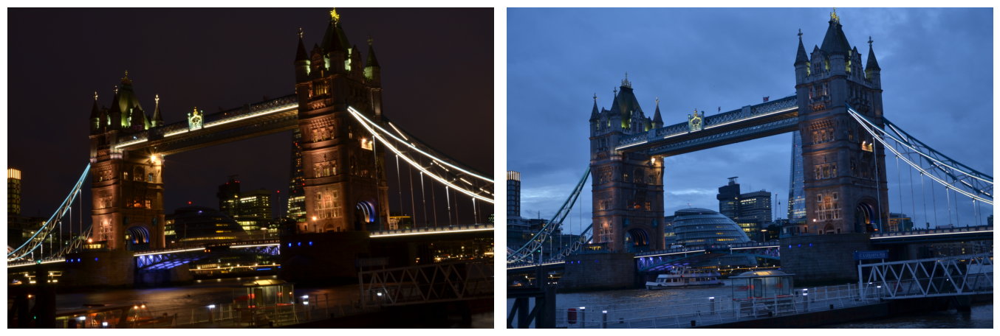

In [ ]:
images = Path("./data/hpatches-sequences-release/i_londonbridge")  # different (i)llumination
image_i_0 = load_image(images / "1.ppm")
image_i_1 = load_image(images / "5.ppm")
plot_images([image_i_0, image_i_1])

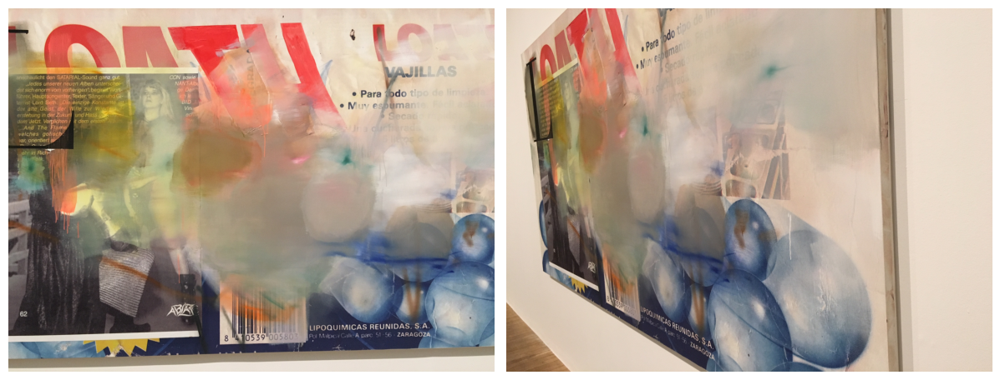

In [100]:
images = Path("./data/hpatches-sequences-release/v_tempera")  # different (v)iewpoint
image_v_0 = load_image(images / "1.ppm")
image_v_1 = load_image(images / "6.ppm")
plot_images([image_v_0, image_v_1])

Finally, I apply the experiment to an image pair under both illumination and viewpoint changes:

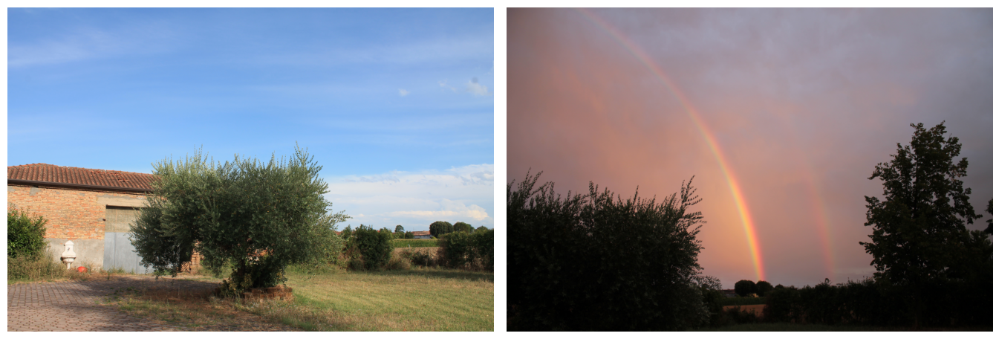

In [21]:
images = Path("./assets")  # different illumination and viewpoint
image_i_v_0 = load_image(images / "i_v_garden_1.JPG")
image_i_v_1 = load_image(images / "i_v_garden_2.JPG")
plot_images([image_i_v_0, image_i_v_1])

### Experiment

In [2]:
ds = HPatchesDataset(resize=480)  # load the dataset
print(f"Total number of image pairs: {len(ds)}")

extractor = SuperPoint(max_num_keypoints=1024).eval().to(device)  # load the extractor
matcher = LightGlue(features="superpoint").eval().to(device)  # load the matcher

Total number of image pairs: 580


In [7]:
def cartesian_to_homogeneous(points: torch.Tensor) -> torch.Tensor:
    ones = torch.ones((points.shape[0], 1), device=points.device, dtype=points.dtype)
    return torch.cat([points, ones], dim=1)


def homogeneous_to_cartesian(points_h: torch.Tensor, eps: float = 0.0) -> torch.Tensor:
    return points_h[..., :-1] / (points_h[..., -1:] + eps)


def project_points(points: torch.Tensor, T: torch.Tensor) -> torch.Tensor:
    points_h = cartesian_to_homogeneous(points)
    proj = (T @ points_h.T).T
    return homogeneous_to_cartesian(proj)


def process_image_pair(
    ex: dict,
) -> Tuple[Optional[torch.Tensor], Optional[torch.Tensor], np.ndarray, int, int]:
    image0 = ex["image0"].to(device)
    image1 = ex["image1"].to(device)
    H_gt = ex.get("H_0to1")
    H, W = image0.shape[-2:]

    # Extract keypoints and perform matching
    feats0, feats1, matches01 = match_pair(extractor, matcher, image0, image1, device)
    matches = matches01["matches"]  # (K, 2)

    # Select only matched keypoints
    kpts0 = feats0["keypoints"][matches[:, 0]]  # (K, 2)
    kpts1 = feats1["keypoints"][matches[:, 1]]  # (K, 2)
    desc0 = feats0["descriptors"][matches[:, 0]]  # (K, D)
    desc1 = feats1["descriptors"][matches[:, 1]]  # (K, D)

    return {
        "keypoints0": kpts0,
        "keypoints1": kpts1,
        "descriptors0": desc0,
        "descriptors1": desc1,
        "H_gt": H_gt,
        "stop_layer": matches01["stop"],
        "height": H,
        "width": W,
    }


def compute_recall(
    kpts0: torch.Tensor,
    kpts1: torch.Tensor,
    desc0: torch.Tensor,
    desc1: torch.Tensor,
    H_gt: torch.Tensor,
    threshold: float = 3.0,
) -> float:
    """
    Compute recall using Kornia's mutual nearest neighbor (MNN) matching
    """
    # Use Kornia's MNN matcher
    mnn_matches = KF.match_mnn(desc0, desc1)[1]  # Tensor of shape (K, 2)

    if mnn_matches.shape[0] == 0:
        return 0.0

    # Matched keypoints
    mkpts0 = kpts0[mnn_matches[:, 0]]
    mkpts1 = kpts1[mnn_matches[:, 1]]

    # Project keypoints from image0 to image1 using H_gt
    mkpts0_proj = project_points(mkpts0, H_gt)
    
    errors = torch.norm(mkpts1 - mkpts0_proj, dim=1)  # reprojection error

    # Compute recall
    correct = (errors < threshold).float().sum().item()
    total = len(errors)
    recall = correct / total
    
    return recall


def compute_auc(errors: torch.Tensor, max_threshold: float) -> float:
    thresholds = torch.linspace(0, max_threshold, 100)
    recall = [(errors <= t).float().mean().item() for t in thresholds]
    auc = torch.trapz(torch.tensor(recall), thresholds) / max_threshold
    return auc.item()


def compute_errors(
    kpts0: torch.Tensor,
    kpts1: torch.Tensor,
    desc0: torch.Tensor,
    desc1: torch.Tensor,
    H_gt: np.ndarray,
    H: int,
    W: int,
    homo_est_method: int,
    ransac_reproj_thr: Optional[float] = None,
) -> Dict[str, float]:
    H_gt = torch.from_numpy(H_gt).to(device)
    kpts0_proj = project_points(kpts0, H_gt)
    reproj_errors = torch.norm(kpts1 - kpts0_proj, dim=1)

    # Precision: fraction of matches within 3px
    correct_matches = (reproj_errors < 3.0).float().sum().item()
    total_matches = kpts0.shape[0]
    precision = correct_matches / total_matches if total_matches > 0 else 0.0

    # Recall: fraction of MNN matches with reprojection error < 3px
    recall = compute_recall(
        kpts0=kpts0,
        kpts1=kpts1,
        desc0=desc0,
        desc1=desc1,
        H_gt=H_gt,
        threshold=3.0,
    )

    # Skip homography estimation if insufficient matches
    if total_matches < 4:
        return {
            "precision@3px": precision,
            "recall": recall,
            "auc@1px": 0.0,
            "auc@5px": 0.0,
        }

    # Homography estimation
    H_est, _ = cv.findHomography(
        kpts0.cpu().numpy(),
        kpts1.cpu().numpy(),
        homo_est_method,
        ransac_reproj_thr,
    )
    if H_est is None:
        return {
            "precision@3px": precision,
            "recall": recall,
            "auc@1px": 0.0,
            "auc@5px": 0.0,
        }

    H_est = torch.from_numpy(H_est).float().to(device)
    corners = torch.tensor(
        [[0, 0], [W - 1, 0], [0, H - 1], [W - 1, H - 1]],
        dtype=torch.float32,
        device=device,
    )

    warped_corners_gt = project_points(corners, H_gt)
    warped_corners_est = project_points(corners, H_est)

    # AUC: fraction of corners within 1px and 5px thresholds
    corner_errors = torch.norm(warped_corners_gt - warped_corners_est, dim=1)
    auc1 = compute_auc(corner_errors, max_threshold=1.0)
    auc5 = compute_auc(corner_errors, max_threshold=5.0)

    return {
        "precision@3px": precision,
        "recall@3px": recall,
        "auc@1px": auc1,
        "auc@5px": auc5,
    }


MethodType = Literal["RANSAC", "MAGSAC", "DLT"]

method_map: Dict[MethodType, int] = {
    "RANSAC": cv.RANSAC,
    "MAGSAC": cv.USAC_MAGSAC,
    "DLT": 0,
}


def benchmark_features(
    ds: torch.utils.data.Dataset,
    method_type: MethodType,
    ransac_reproj_thr: Optional[float] = None,
) -> None:
    homo_est_method = method_map[method_type]
    results = []

    for i in tqdm(range(len(ds)), desc="Benchmarking"):
        ex = ds[i]
        out = process_image_pair(ex)
        kpts0 = out["keypoints0"]
        kpts1 = out["keypoints1"]
        desc0 = out["descriptors0"]
        desc1 = out["descriptors1"]
        H_gt = out["H_gt"]
        H = out["height"]
        W = out["width"]

        metrics = compute_errors(
            kpts0, kpts1, desc0, desc1, H_gt, H, W, homo_est_method, ransac_reproj_thr
        )
        results.append(metrics)

    avg_metrics = {k: np.mean([m[k] for m in results]) for k in results[0]}

    print(f"== Final results - {method_type} ==")
    for k, v in avg_metrics.items():
        print(f"{k}: {v:.4f}")

In [9]:
homo_est_methods = ["RANSAC", "MAGSAC", "DLT"]

for method in homo_est_methods:
    benchmark_features(ds, method, 5.0)

Benchmarking:   0%|          | 0/580 [00:00<?, ?it/s]

Benchmarking: 100%|██████████| 580/580 [00:54<00:00, 10.62it/s]


== Final results - RANSAC ==
precision@3px: 0.8756
recall@3px: 0.8328
auc@1px: 0.4172
auc@5px: 0.7557


Benchmarking: 100%|██████████| 580/580 [00:53<00:00, 10.89it/s]


== Final results - MAGSAC ==
precision@3px: 0.8756
recall@3px: 0.8328
auc@1px: 0.4360
auc@5px: 0.7665


Benchmarking: 100%|██████████| 580/580 [00:53<00:00, 10.87it/s]

== Final results - DLT ==
precision@3px: 0.8756
recall@3px: 0.8328
auc@1px: 0.4079
auc@5px: 0.7492


### Presenting the results

In [4]:
def find_pair(scene: str, seq_idx: Literal[2, 3, 4, 5, 6]) -> Optional[int]:
    if not (2 <= seq_idx <= 6):
        raise ValueError("seq_idx must be between 2 and 6")

    for i in tqdm(range(len(ds))):
        ex = ds[i]
        if ex["scene"] == scene and ex["seq_idx"] == seq_idx:
            return i
    return None


def visualize_matches(image0: torch.Tensor, image1: torch.Tensor) -> None:
    ex = {"image0": image0, "image1": image1}
    out = process_image_pair(ex)
    kpts0 = out["keypoints0"]
    kpts1 = out["keypoints1"]
    stop_layer = out["stop_layer"]

    plot_images([image0, image1])
    plot_matches(kpts0, kpts1, color="lime", lw=0.2)
    add_text(0, f"Stop after {stop_layer} layers", fs=20)
    plt.show()


def to_numpy(img):
    img = img.permute(1, 2, 0).cpu().numpy()
    if img.max() <= 1.0:
        img = (img * 255).astype(np.uint8)
    return img


def visualize_image_warping(
    image0: torch.Tensor, image1: torch.Tensor, a: float = 0.5
) -> None:
    ex = {"image0": image0, "image1": image1}
    out = process_image_pair(ex)
    kpts0 = out["keypoints0"].cpu().numpy()
    kpts1 = out["keypoints1"].cpu().numpy()

    H, _ = cv.findHomography(kpts1, kpts0, cv.USAC_MAGSAC, ransacReprojThreshold=5.0)

    img0 = to_numpy(image0)
    img1 = to_numpy(image1)

    T = np.array([[1, 0, 0], [0, 1, img0.shape[0] / 2], [0, 0, 1]], dtype=np.float32)
    H = T @ H

    h, w = img0.shape[:2]

    warped = cv.warpPerspective(img1, H, (img1.shape[1] * 2, img1.shape[0] * 2))

    warped[h // 2 : h // 2 + h, 0:w, :] = (
        warped[h // 2 : h // 2 + h, 0:w, :] * (1.0 - a) + img0 * a
    )

    plt.imshow(warped)
    plt.axis("off")
    plt.show()

#### Image pair under illumination changes:

 25%|██▍       | 143/580 [00:09<00:28, 15.08it/s]


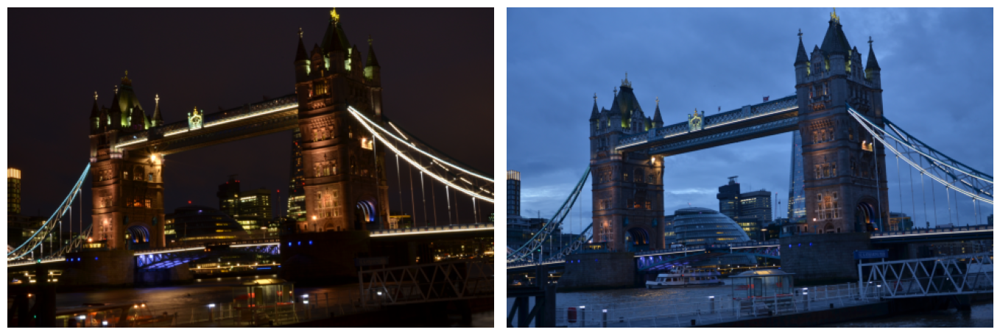

In [11]:
pair_idx_i = find_pair("i_londonbridge", 5)
ex_i = ds[pair_idx_i]
plot_images([ex_i["image0"], ex_i["image1"]])

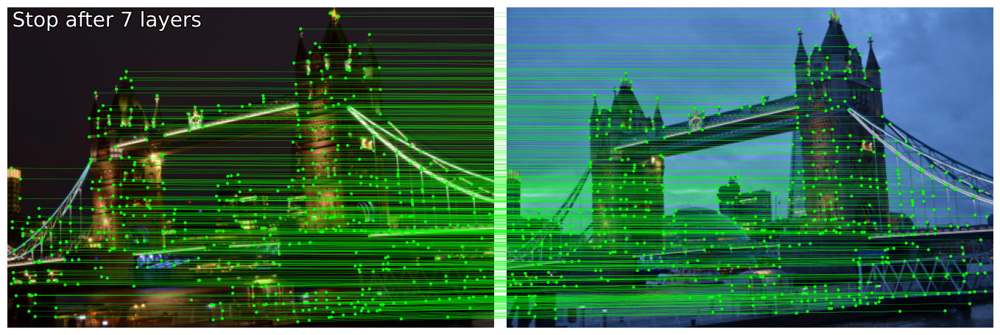

In [12]:
visualize_matches(ex_i["image0"], ex_i["image1"])

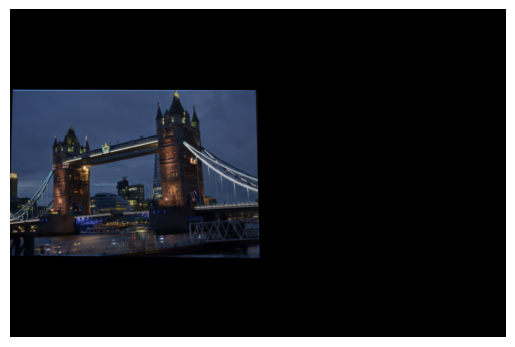

In [13]:
visualize_image_warping(ex_i["image0"], ex_i["image1"], a=0.5)

#### Image pair under viewpoint changes:

 89%|████████▉ | 519/580 [00:31<00:03, 16.69it/s]


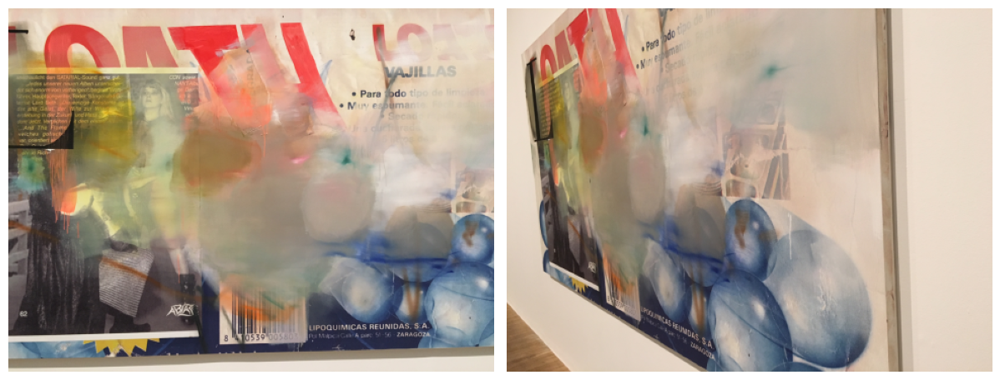

In [5]:
pair_idx_v = find_pair("v_tempera", 6)
ex_v = ds[pair_idx_v]
plot_images([ex_v["image0"], ex_v["image1"]])

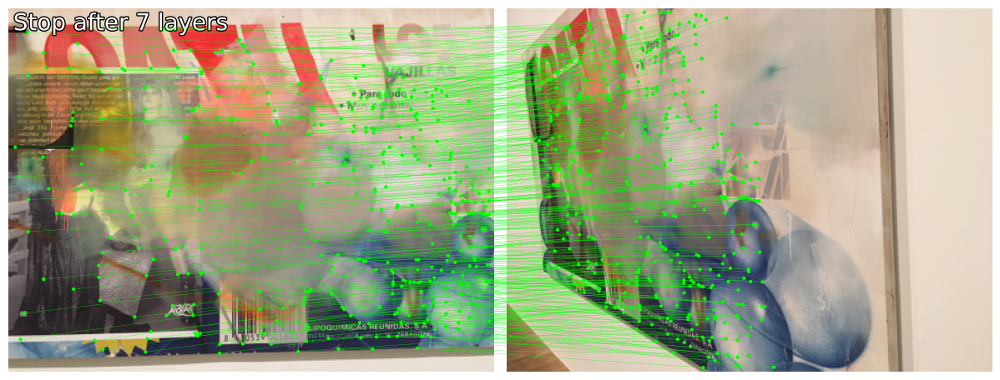

In [14]:
visualize_matches(ex_v["image0"], ex_v["image1"])

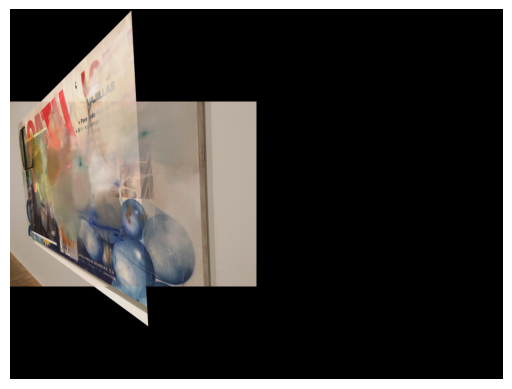

In [16]:
visualize_image_warping(ex_v["image1"], ex_v["image0"], a=0.8)

#### Image pair under both illumination and viewpoint changes:

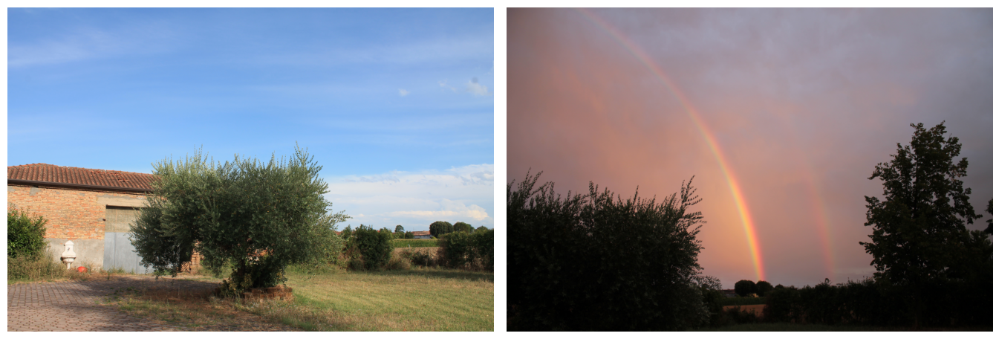

In [257]:
plot_images([image_i_v_0, image_i_v_1])

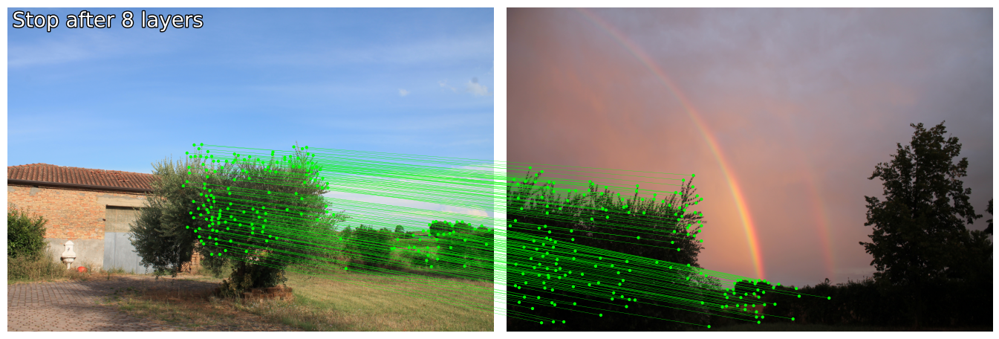

In [238]:
visualize_matches(image_i_v_0, image_i_v_1)

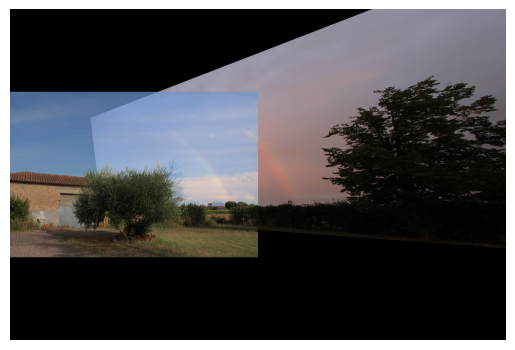

In [277]:
visualize_image_warping(image_i_v_0, image_i_v_1, a=0.7)